In [1]:
import numpy as np
import pandas as pd

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/playground-series-s4e2/sample_submission.csv
/kaggle/input/playground-series-s4e2/train.csv
/kaggle/input/playground-series-s4e2/test.csv


Соревноание: [Многоклассовое прогнозирование риска ожирения](https://www.kaggle.com/competitions/playground-series-s4e2)

Целевая переменная: `NObeyesdad` (категориальная)

In [2]:
!pip install ydata-profiling==4.10.0
!pip install numba==0.58.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 41.5 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.3 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
tsfresh 0.20.3 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 29.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import pandas as pd  
from sklearn.metrics import accuracy_score  
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report

from ydata_profiling import ProfileReport

In [4]:
data = pd.read_csv('/kaggle/input/playground-series-s4e2/train.csv')
print(data.shape)
data.head()

(20758, 18)


,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


## EDA

In [5]:
profile = ProfileReport(
    data.drop(["NObeyesdad"], axis=1), title="Profile Report of Obesity Risk Dataset", explorative=True
)

In [6]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
weight_corr = ['Gender', 'family_history_with_overweight']
height_corr = ['Gender']
unique = ['id']

cols_to_drop = set(
    weight_corr +
    height_corr +
    unique
)

data_selected = data.drop(cols_to_drop, axis=1)
data_selected.shape

(20758, 15)

In [8]:
profile2 = ProfileReport(
    data_selected.drop(["NObeyesdad"], axis=1), title="Profile Report of Obesity Risk Dataset", explorative=True
)

profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
data_selected.isna().sum()

Age           0
Height        0
Weight        0
FAVC          0
FCVC          0
NCP           0
CAEC          0
SMOKE         0
CH2O          0
SCC           0
FAF           0
TUE           0
CALC          0
MTRANS        0
NObeyesdad    0
dtype: int64

## Подготовка данных и обучение модели

In [10]:
X = data_selected.drop('NObeyesdad', axis=1)
y = data_selected['NObeyesdad']

In [11]:
objects = ['object','category', 'bool']
cat_features = X.select_dtypes(include=objects).columns.tolist()
X[cat_features].head()

,FAVC,CAEC,SMOKE,SCC,CALC,MTRANS
0,yes,Sometimes,no,no,Sometimes,Public_Transportation
1,yes,Frequently,no,no,no,Automobile
2,yes,Sometimes,no,no,no,Public_Transportation
3,yes,Sometimes,no,no,Sometimes,Public_Transportation
4,yes,Sometimes,no,no,Sometimes,Public_Transportation


In [12]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_features = X.select_dtypes(include=numerics).columns.tolist()
X[num_features].head()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
0,24.443011,1.699998,81.669950,2.000000,2.983297,2.763573,0.000000,0.976473
1,18.000000,1.560000,57.000000,2.000000,3.000000,2.000000,1.000000,1.000000
2,18.000000,1.711460,50.165754,1.880534,1.411685,1.910378,0.866045,1.673584
3,20.952737,1.710730,131.274851,3.000000,3.000000,1.674061,1.467863,0.780199
4,31.641081,1.914186,93.798055,2.679664,1.971472,1.979848,1.967973,0.931721


In [13]:
num_pipeline = Pipeline(steps=[
    ('std_scaler', StandardScaler()),
])

cat_pipeline = Pipeline(steps=[
    ("onehot", OneHotEncoder(handle_unknown='ignore'))
])


preprocessor = ColumnTransformer(transformers=[
    ("num", num_pipeline, num_features),
    ("cat", cat_pipeline, cat_features)
])

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [15]:
from lightgbm import LGBMClassifier

In [16]:
baseline = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("model", LGBMClassifier(random_state=42, num_class=len(np.unique(y)), verbose=-1))
    ]
)

baseline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('std_scaler',
                                                                   StandardScaler())]),
                                                  ['Age', 'Height', 'Weight',
                                                   'FCVC', 'NCP', 'CH2O', 'FAF',
                                                   'TUE']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['FAVC', 'CAEC', 'SMOKE',
                                                   'SCC', 'CALC',
                                                   'MTRANS'])])),
                ('model',
                 LGBMClassifier(num_class=7, random_state=42, verbose=-1))])

In [17]:
y_preds_baseline = baseline.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_preds_baseline))
print("Classification Report:\n", classification_report(y_test, y_preds_baseline))

Accuracy: 0.8986030828516378
Classification Report:
                      precision    recall  f1-score   support

Insufficient_Weight       0.95      0.93      0.94       524
      Normal_Weight       0.88      0.88      0.88       626
     Obesity_Type_I       0.86      0.86      0.86       543
    Obesity_Type_II       0.96      0.97      0.97       657
   Obesity_Type_III       0.99      0.99      0.99       804
 Overweight_Level_I       0.77      0.80      0.79       484
Overweight_Level_II       0.80      0.79      0.79       514

           accuracy                           0.90      4152
          macro avg       0.89      0.89      0.89      4152
       weighted avg       0.90      0.90      0.90      4152



In [18]:
cross_val_score(baseline, X, y, cv=3, scoring='accuracy').mean()

0.899412420519187

## Подбор гиперпараметров

In [36]:
from hyperopt import fmin, tpe, hp, Trials

In [37]:
param_space = {
    'n_estimators': hp.choice('n_estimators', list(range(10, 600, 5))),
    'max_depth': hp.choice('max_depth', [-1] + list(range(1, 150, 5))),
    'num_leaves': hp.choice('num_leaves', list(range(2, 60, 5))),
    'subsample': hp.choice('subsample', [0.1, 0.2, 0.4, 0.6, 0.8, 1, 0.12, 0.18, 0.01, 0.001, 0.0001]),
}

`n_estimators` -- кол-во деревьев (по умолчнию - `100`)

`max_depth` -- максимальная глубина деревьев (по умолчнию - `-1`). `max_depth <= 0` означает отсутствие ограничений. 

`num_leaves` -- максимальное количество листьев дерева (по умолчнию - `31`)

`subsample` -- коэффициент подвыборки обучающего экземпляра (по умолчнию - `1.`)

Параметры были выбраны так, чтобы они, были в определенном диапазоне от своих базовых значений

In [38]:
def obj_fnc(params):
    model = Pipeline(
        steps=[
            ("preprocessor", preprocessor),
            ("model", LGBMClassifier(**params, random_state=42, num_class=len(np.unique(y)), verbose=-1))
        ]
    )
    
    accuracy = cross_val_score(model, X, y, cv=3, scoring='accuracy').mean()
    return -1*accuracy

In [39]:
%%time
trials = Trials()
best_params = fmin(obj_fnc, space=param_space, algo=tpe.suggest, max_evals=100,
                   trials=trials, show_progressbar=True, catch_eval_exceptions=True)

100%|██████████| 100/100 [32:13<00:00, 19.34s/trial, best loss: -0.9028328837322377]
CPU times: user 32min 11s, sys: 1.32 s, total: 32min 13s
Wall time: 32min 13s


In [40]:
trials.best_trial['result']['loss']

-0.9028328837322377

In [41]:
best_params

{'max_depth': 10, 'n_estimators': 37, 'num_leaves': 1, 'subsample': 6}

In [42]:
from hyperopt import space_eval
res_params = space_eval(param_space, trials.argmin)
res_params

{'max_depth': 46, 'n_estimators': 195, 'num_leaves': 7, 'subsample': 0.12}

In [43]:
results = pd.DataFrame(trials)

for param in trials.__dict__['_trials'][0]['misc']['vals'].keys():
    results[param] = results.misc.apply(lambda x: x['vals'][param][0])
    
results['loss'] = results.result.apply(lambda x: x['loss'])
results = results[['max_depth', 'n_estimators', 'num_leaves', 'subsample', 'loss']]
results.head()

,max_depth,n_estimators,num_leaves,subsample,loss
0,13,106,0,1,-0.889922
1,9,45,4,2,-0.899364
2,21,11,3,10,-0.900617
3,26,62,6,7,-0.896136
4,17,23,10,7,-0.897293


In [44]:
import seaborn as sns

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='max_depth', ylabel='loss'>

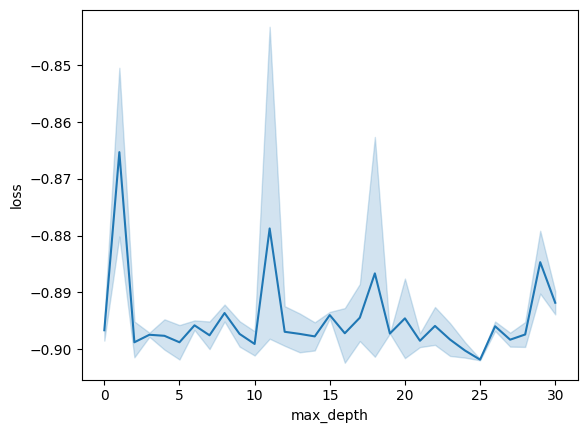

In [45]:
sns.lineplot(results, y='loss', x='max_depth')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='n_estimators', ylabel='loss'>

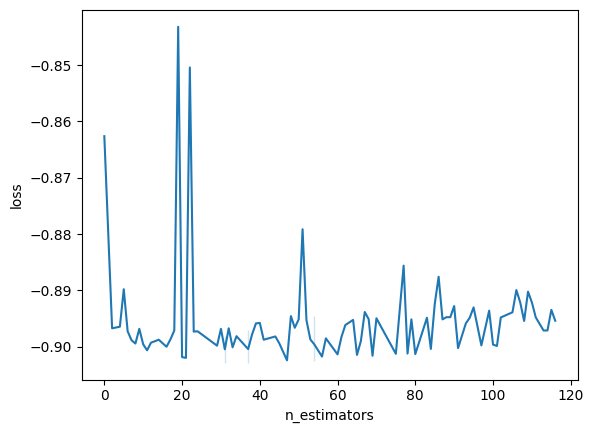

In [46]:
sns.lineplot(results, y='loss', x='n_estimators')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='num_leaves', ylabel='loss'>

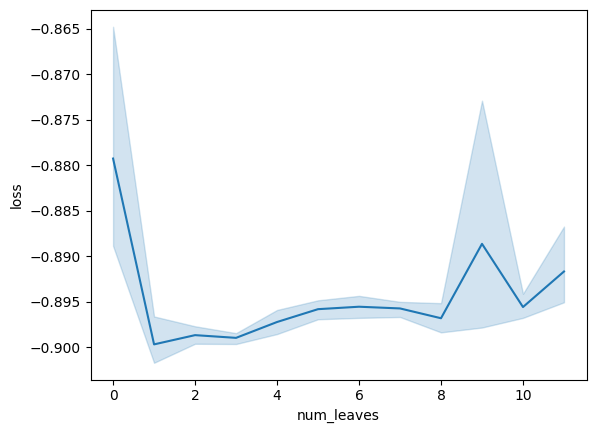

In [47]:
sns.lineplot(results, y='loss', x='num_leaves')

Не сммотря на сильные колебания `loss` относительно `num_leaves`, можно сделать предположение, что начиная с `num_leaves=2` и более показатель `loss` имеет тенденцию к увеличению

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='subsample', ylabel='loss'>

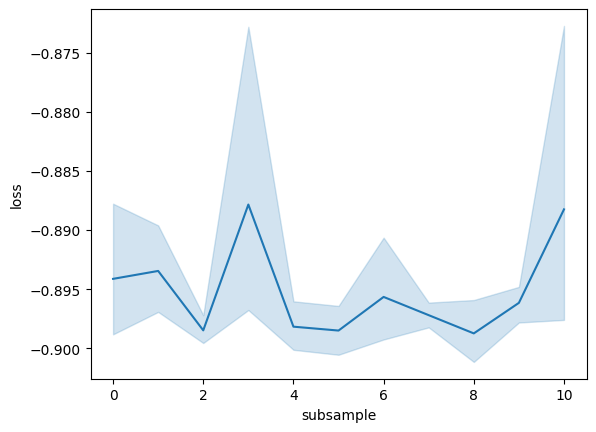

In [48]:
sns.lineplot(results, y='loss', x='subsample')

Визуально закономернсть между параметрами и `loss` просматривается только у параметра `num_leaves`, но это предположение не является точным